# Test Images Analysis - Combined Augmented Model

This notebook analyzes test images using the combined augmented model approach. We'll:
1. Load the trained model
2. Process test images
3. Create visualization maps with orientation arrows

In [2]:
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import pickle

# Add src directory to Python path
sys.path.append(os.path.abspath('../src'))

from fiber_predictor.svr_hog.feature_extraction import HogFeatureExtractor

In [3]:
# Load the combined augmented model
MODEL_PATH = '../models/svr_hog/combined_augmented.pkl'

with open(MODEL_PATH, 'rb') as f:
    model = pickle.load(f)

# Initialize HOG feature extractor
GRID_QUOTIENT = np.arange(1, 4)
ORIENTATIONS = 10
hog_extractor = HogFeatureExtractor(grid_quotient=GRID_QUOTIENT, orientations=ORIENTATIONS)

In [4]:
def check_image(image):
    """Check if image is valid (not too bright/dark)"""
    img = np.array(image)
    if np.mean(img) < .05*256 or np.mean(img) > .95*256:
        return False
    return True

def slice_image(image, voxel_size):
    """Slice image into voxels"""
    height, width = image.shape
    voxel_list = []
    pos_list = []
    
    for y in range(0, height - voxel_size + 1, voxel_size):
        for x in range(0, width - voxel_size + 1, voxel_size):
            voxel = image[y:y + voxel_size, x:x + voxel_size]
            voxel_list.append(voxel)
            pos_list.append([x, y])
            
    return np.array(voxel_list), np.array(pos_list)

def get_orientation_map(model, voxel_list, pos_list, voxel_size):
    """Generate orientation map for voxels"""
    angle_list = []
    x = pos_list[:, 0] + voxel_size / 2
    y = pos_list[:, 1] + voxel_size / 2
    u, v = [], []
    valid_count, invalid_count = 0, 0
    
    for voxel in voxel_list:
        if check_image(voxel):
            feature_vector = hog_extractor(voxel).reshape(1, -1)
            angle = model.predict(feature_vector)[0] * (np.pi/180)
            angle_list.append(angle)
            u.append(np.cos(angle))
            v.append(np.sin(angle))
            valid_count += 1
        else:
            angle_list.append(None)
            u.append(0)
            v.append(0)
            invalid_count += 1
            
    return x, y, u, v, angle_list, (valid_count, invalid_count)

def plot_map(image, img_name, x, y, u, v, counts, color="yellow", scale=1, figsize=(8, 8)):
    """Plot orientation map over image"""
    plt.figure(figsize=figsize)
    plt.imshow(image, cmap="gray")
    plt.quiver(x, y, u, v, color=color, pivot="middle", scale=scale)
    plt.axis("off")
    plt.title(f"Image: {img_name} | Valid voxels: {counts[0]} / {counts[0]+counts[1]}")
    plt.show()

# Optional: Add analysis of angle distributions
def plot_angle_distribution(angle_list, img_name):
    """Plot histogram of predicted angles"""
    valid_angles = [angle for angle in angle_list if angle is not None]
    angles_degrees = np.array(valid_angles) * (180/np.pi)
    
    plt.figure(figsize=(12, 4))
    plt.hist(angles_degrees, bins=36, range=(0, 180))
    plt.title(f"Angle Distribution - {img_name}")
    plt.xlabel("Angle (degrees)")
    plt.ylabel("Count")
    plt.grid(True)
    plt.show()

## Test: Inferencing on Biological(Training) Dataset with Combined Model

Found 5 test images


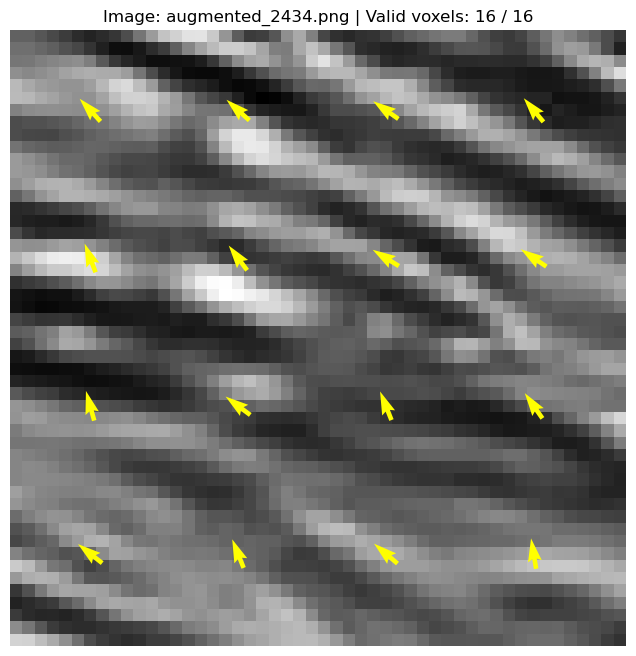

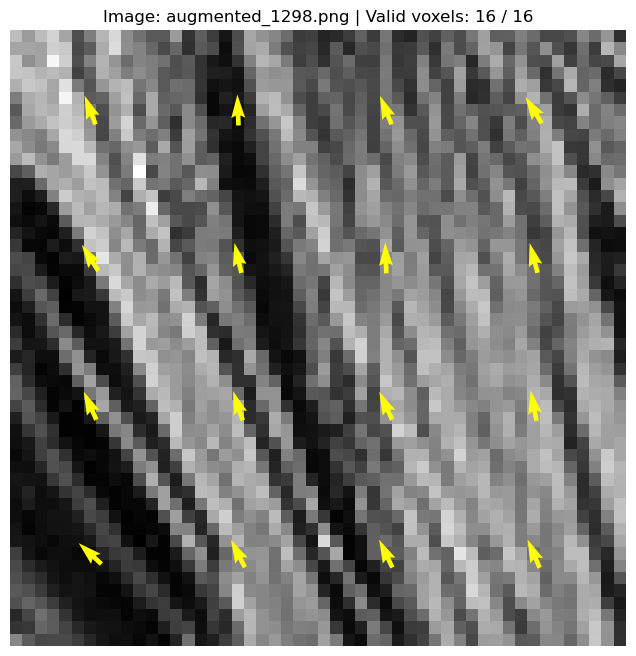

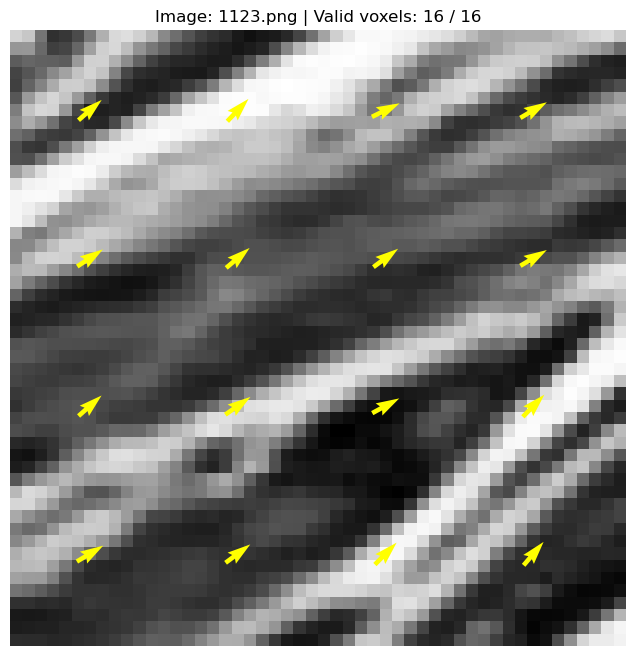

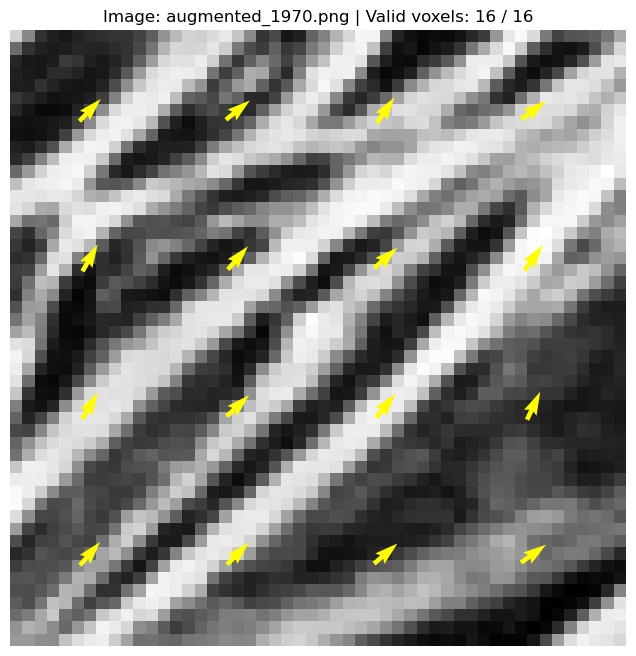

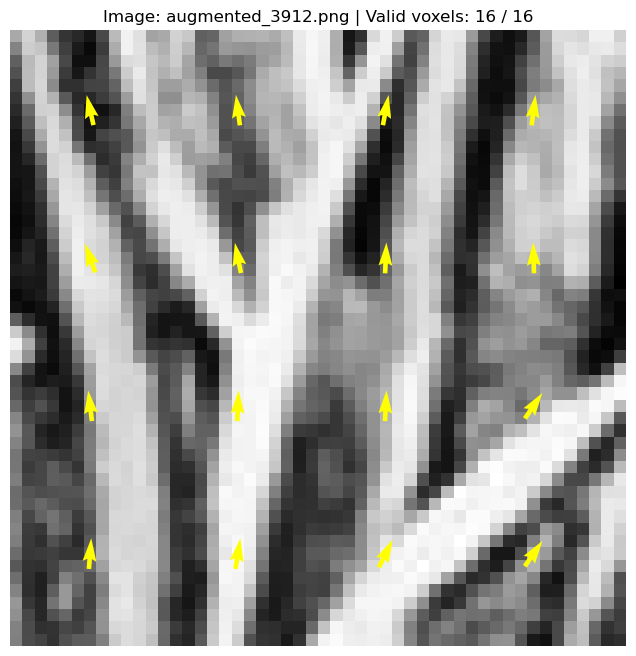

In [5]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/bio'
VOXEL_SIZE = 12

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')][::1024]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=20)

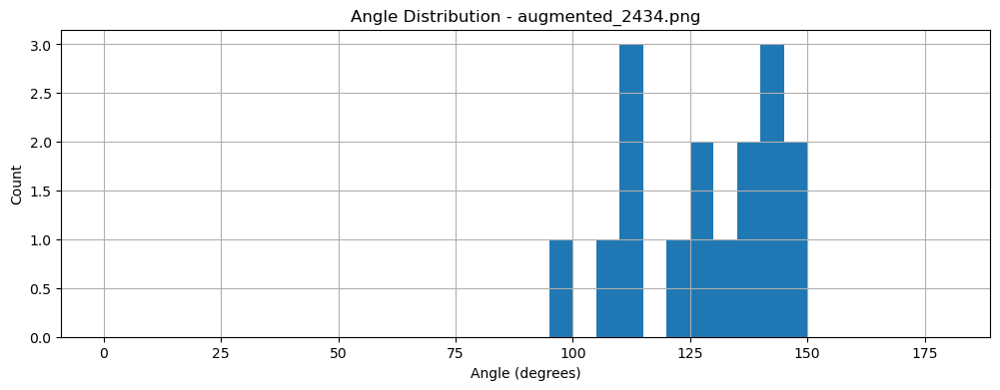

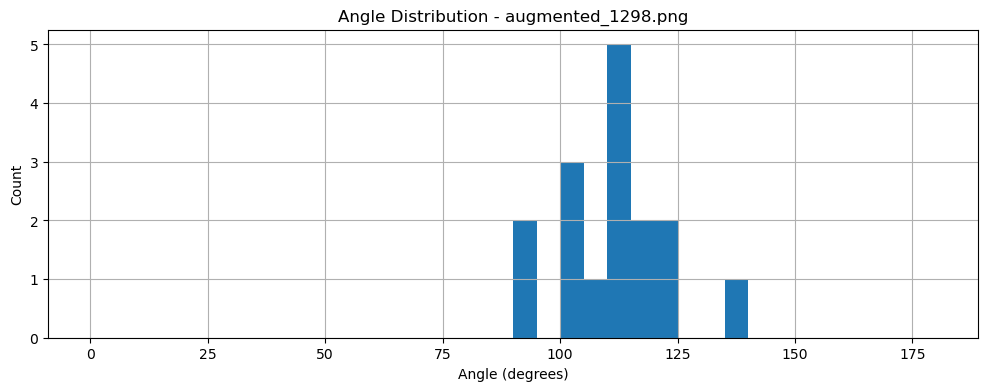

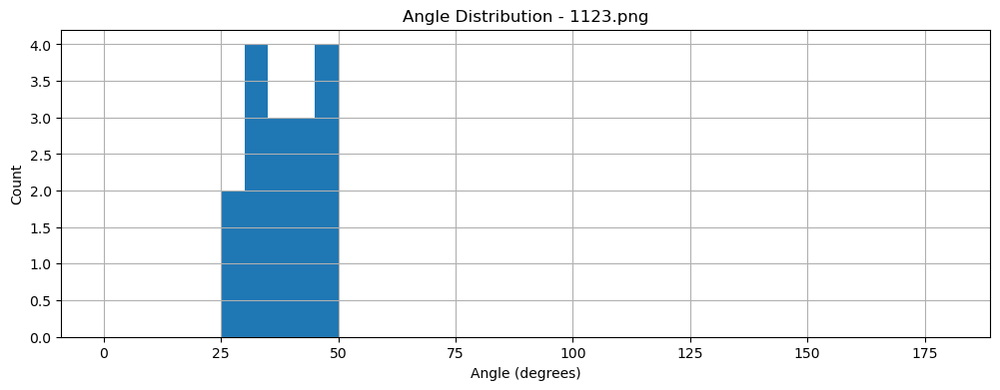

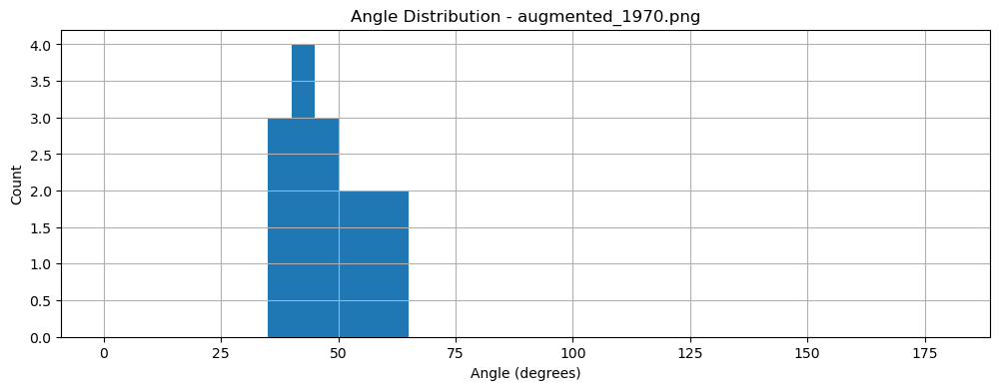

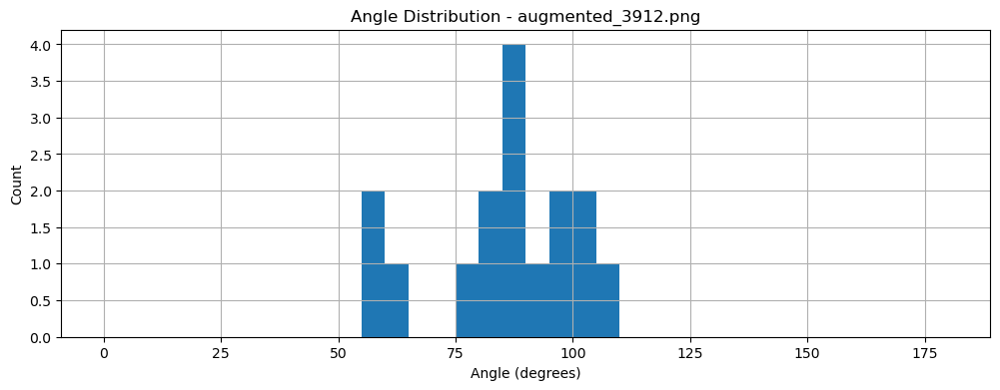

In [6]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

## Test: Native Porcine, Commercial Porcine, Commercial Bovine with Combined Model

Found 3 test images


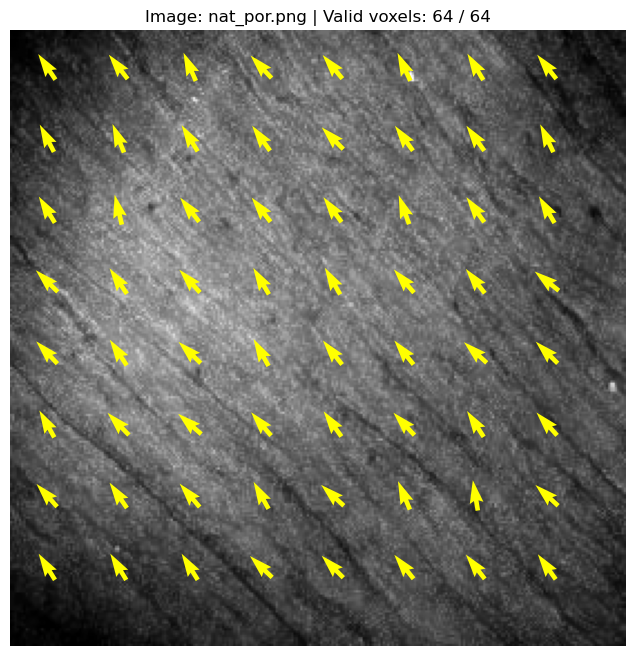

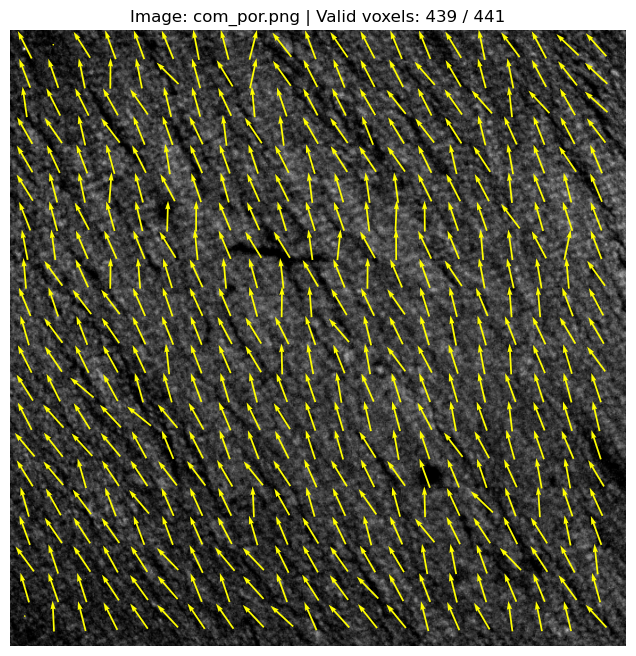

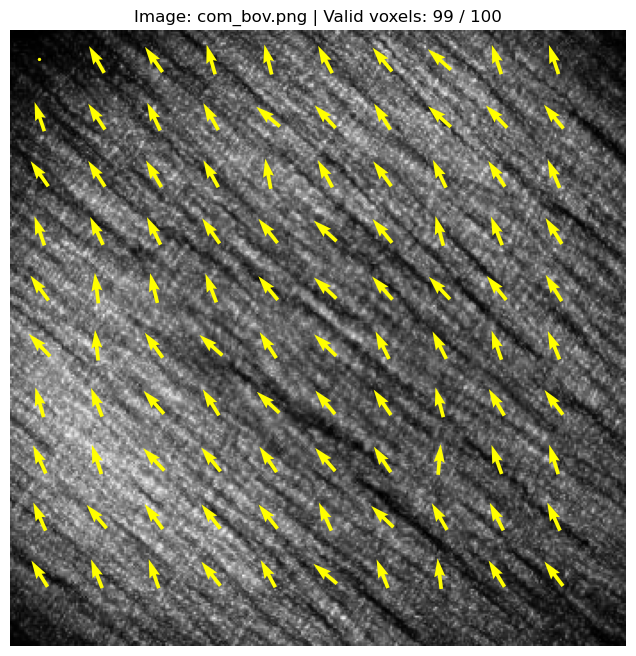

In [7]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/eda_new'
VOXEL_SIZE = 32

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=20)

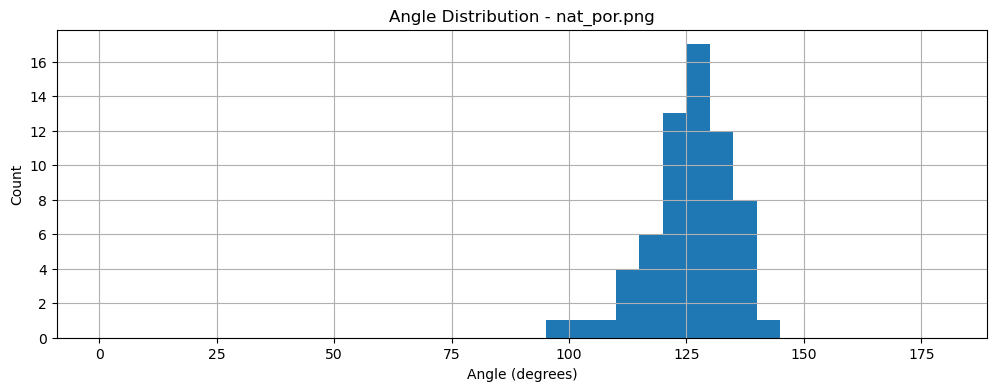

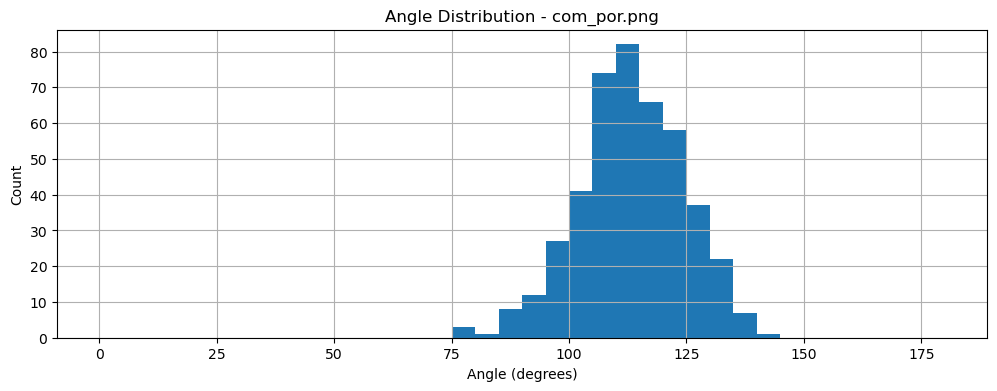

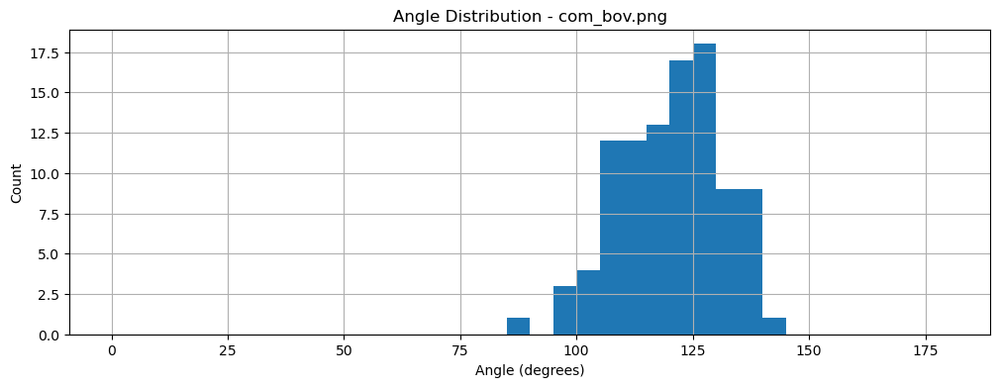

In [8]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

## Test: Inferencing on Porcine(Pericardium) with Combined Model

Found 4 test images


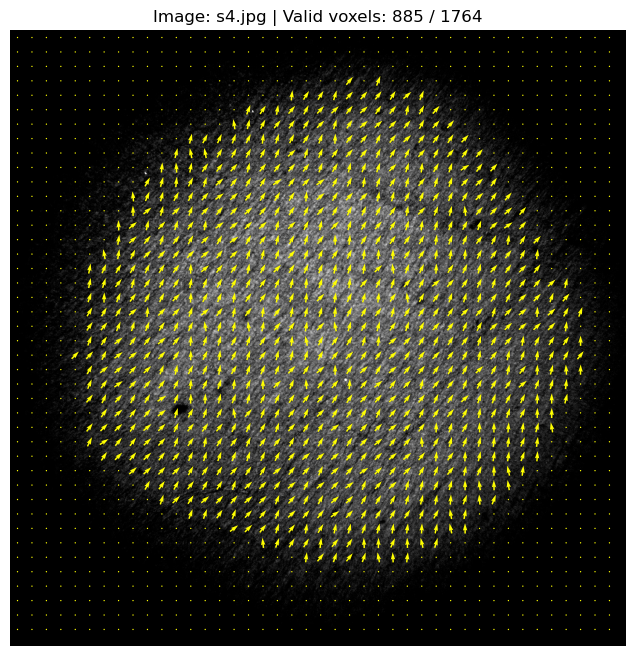

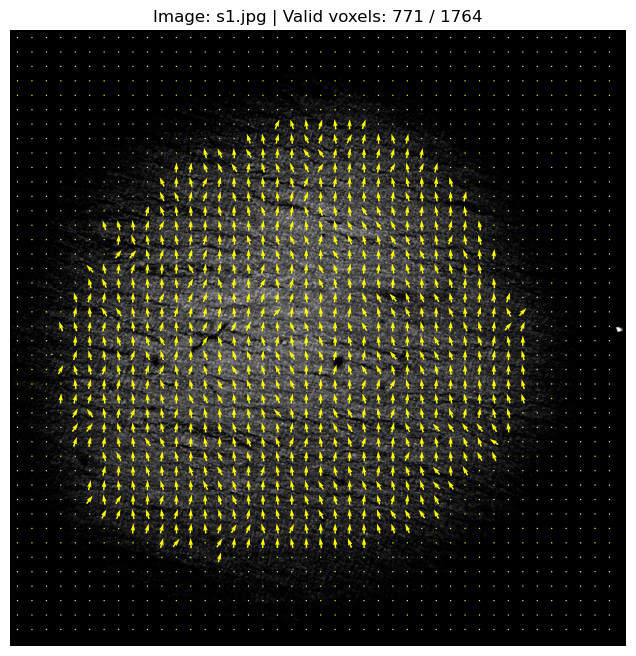

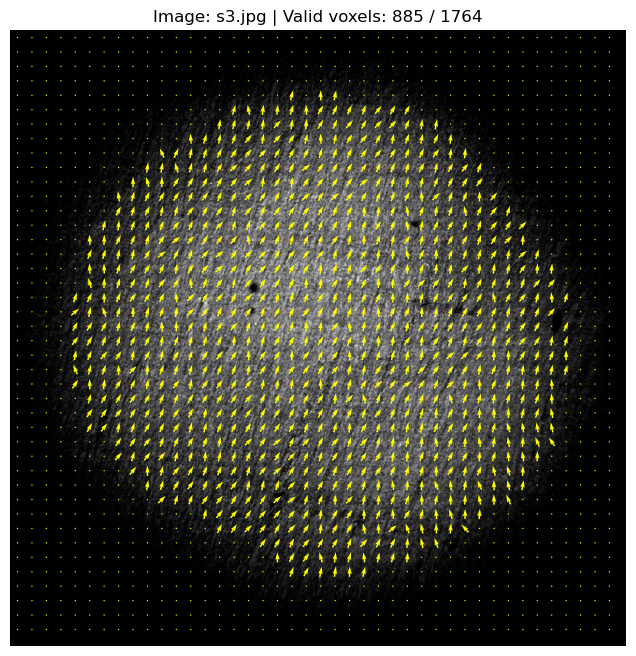

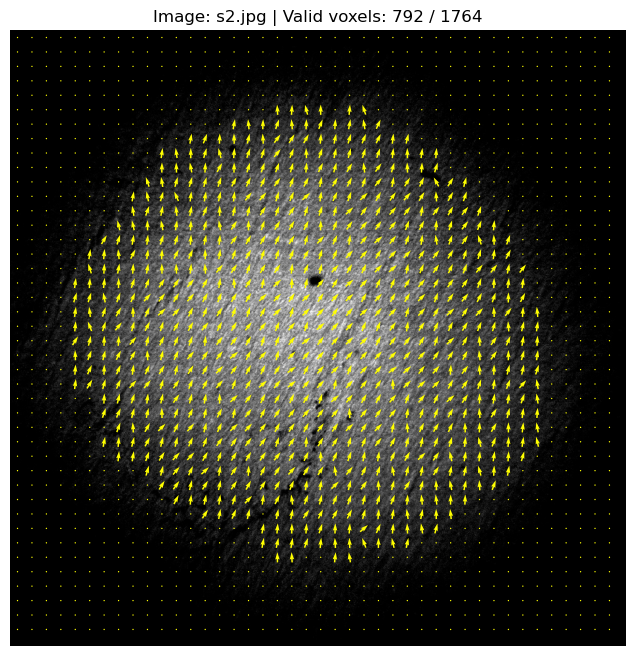

In [9]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/porcine_pericardium'
VOXEL_SIZE = 24

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.jpg')][:-1]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=60)

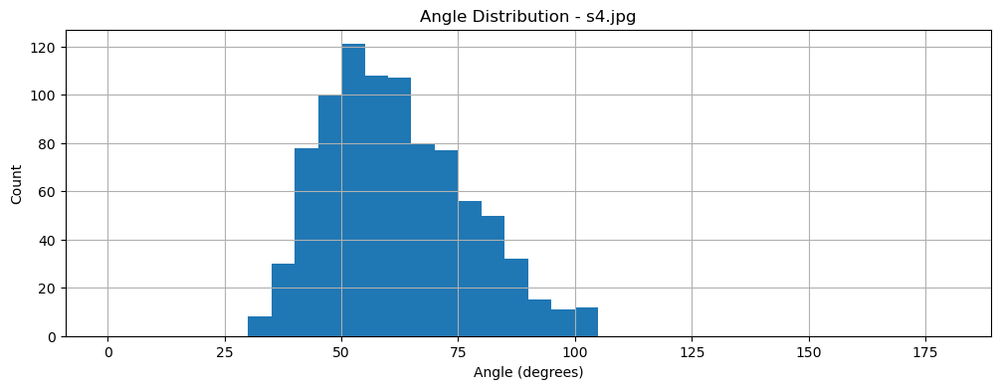

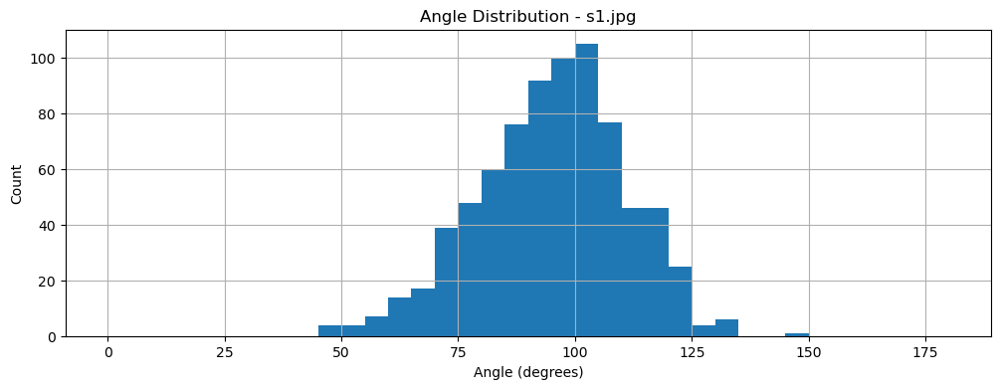

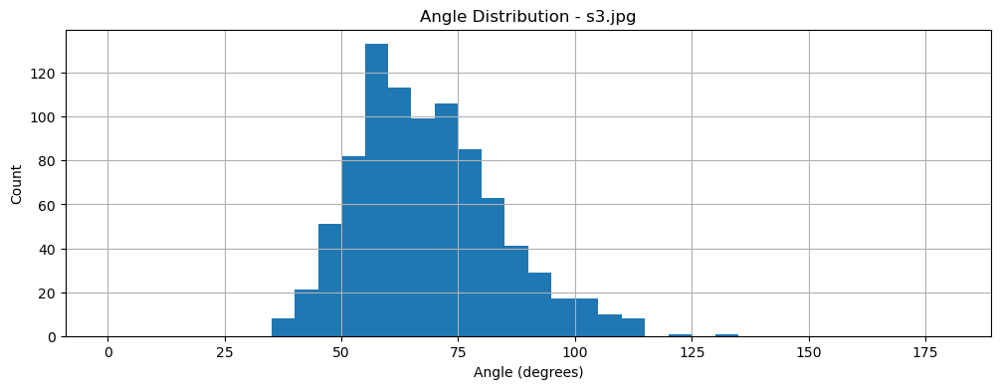

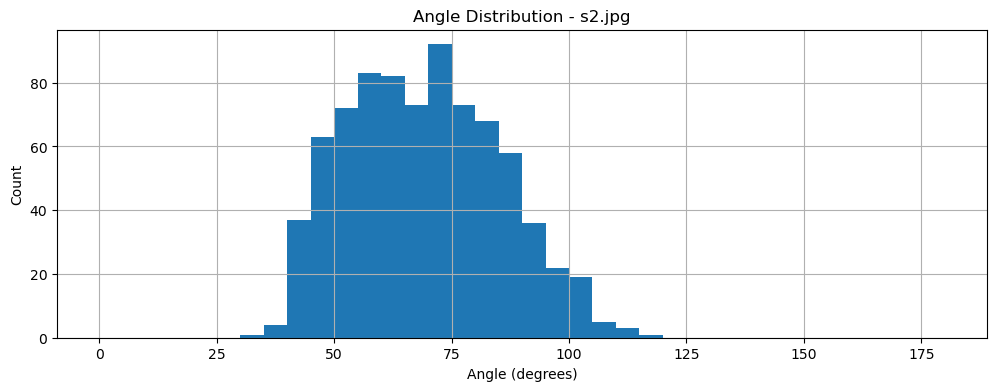

In [10]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

##  Test: Inferencing on Generated Images with Diffusion Combined Model


In [11]:
# Load the combined augmented model
MODEL_PATH = '../models/svr_hog/diff_augmented.pkl'

with open(MODEL_PATH, 'rb') as f:
    model = pickle.load(f)


Found 3 test images


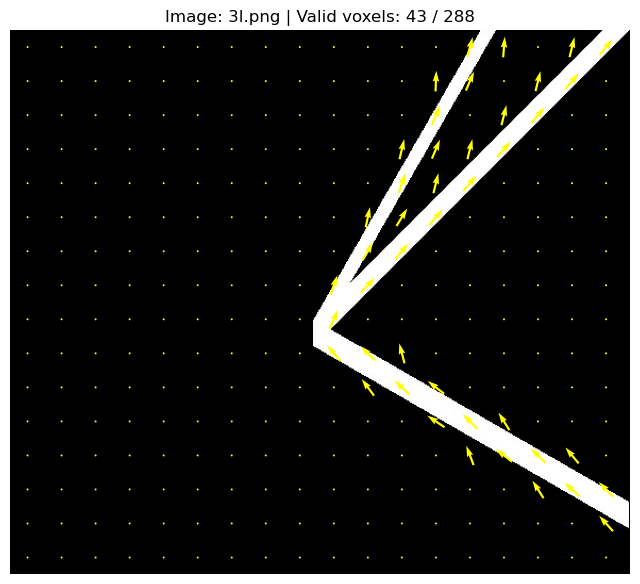

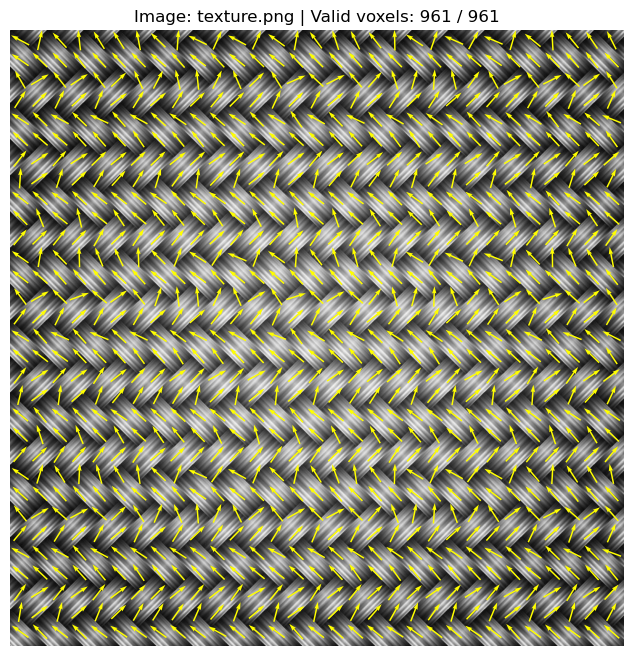

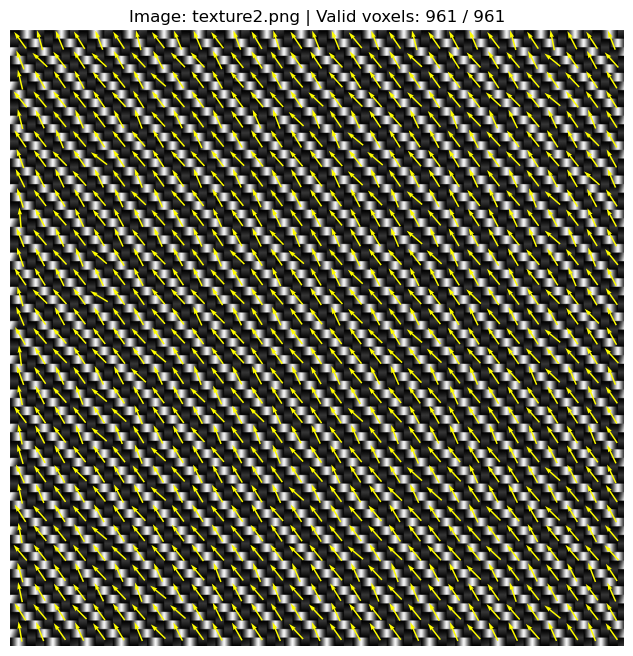

In [12]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/test_samples'
VOXEL_SIZE = 32

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=30, color="yellow")

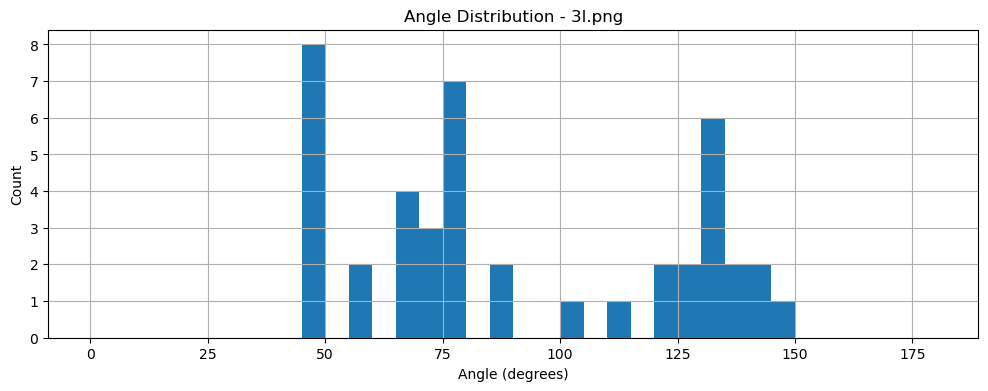

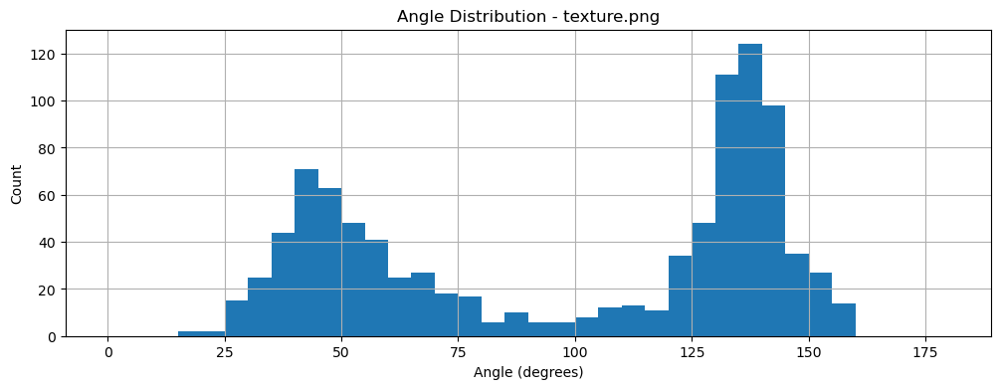

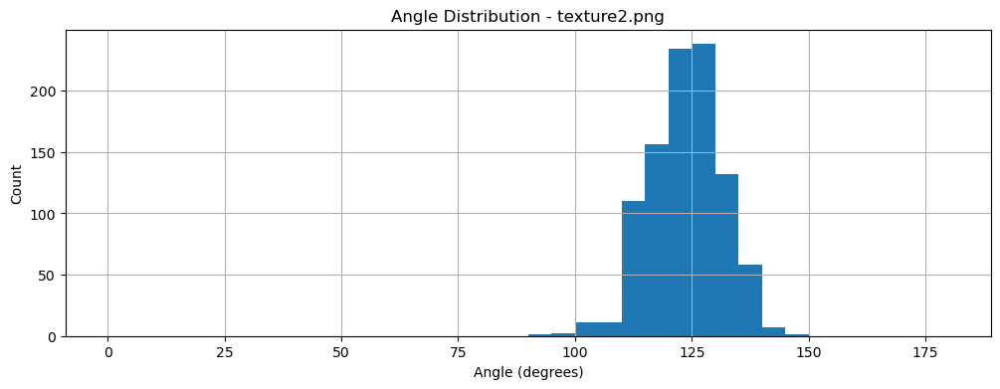

In [13]:
# Process images again but this time analyze angle distributions
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    image = np.array(Image.open(img_path).convert('L'))
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    _, _, _, _, angle_list, _ = get_orientation_map(model, voxel_list, pos_list, VOXEL_SIZE)
    plot_angle_distribution(angle_list, img_name)

##  Test: Inferencing on Torus Slices with Diffusion Combined Model


Found 15 test images


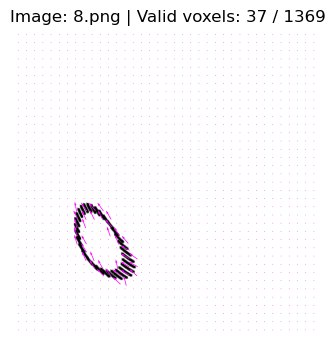

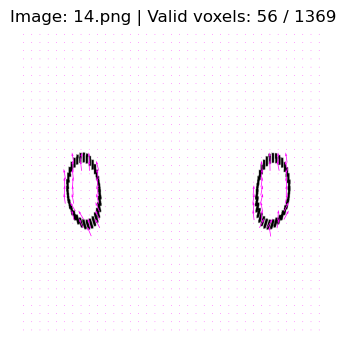

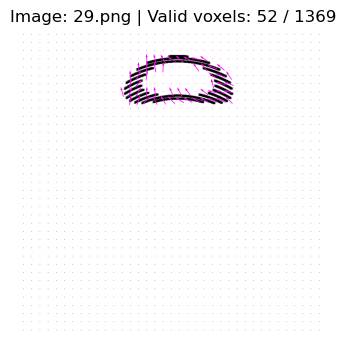

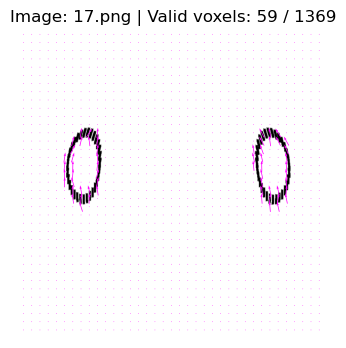

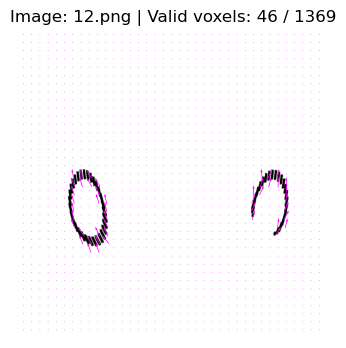

...

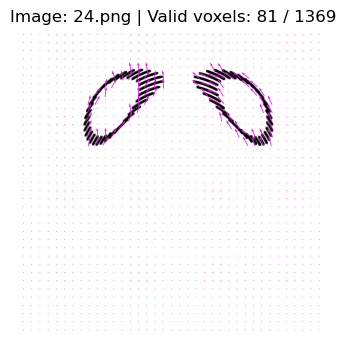

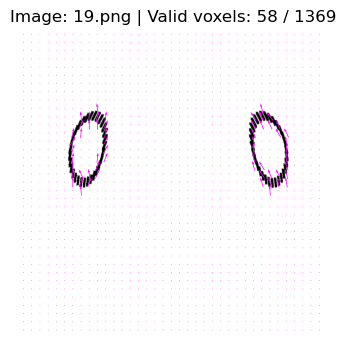

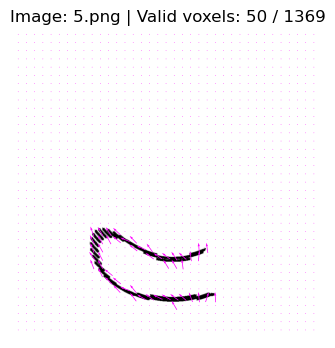

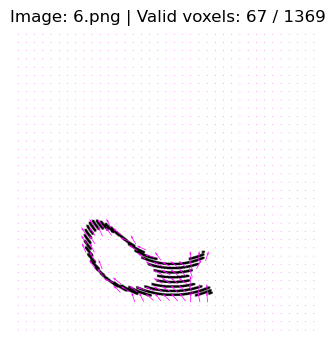

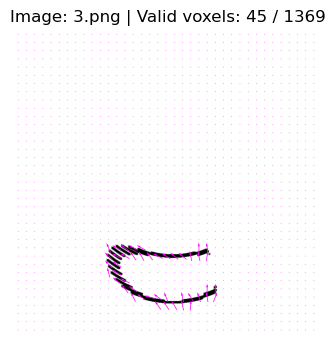

In [14]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/test_samples/XY'
VOXEL_SIZE = 24

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')][::2]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name, x, y, u, v, counts, scale=30, color='magenta', figsize=(4, 4))

##  Test: Inferencing on Diffusion Images with Diffusion Combined Model


Found 7 test images


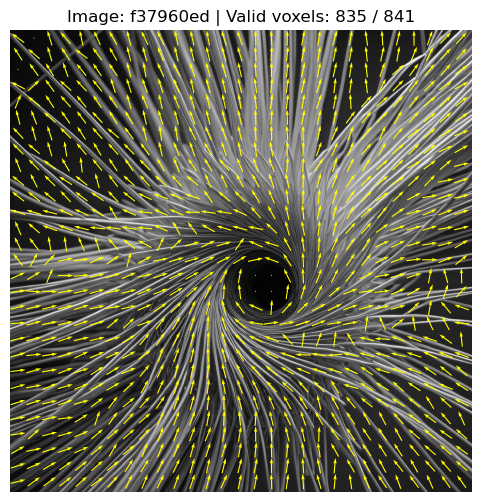

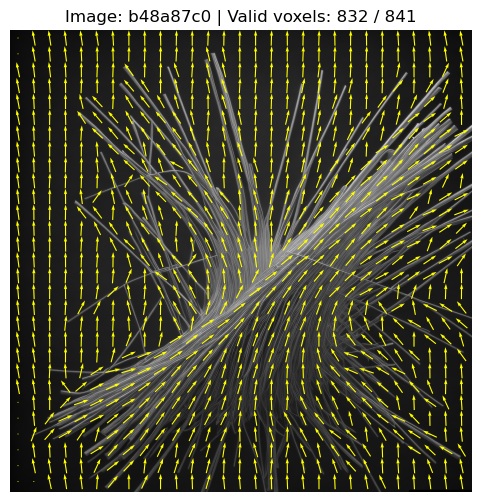

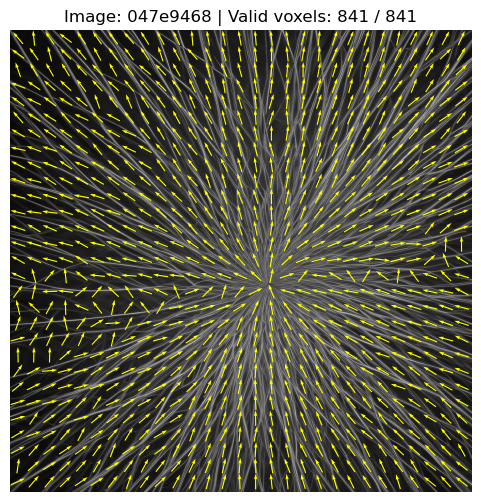

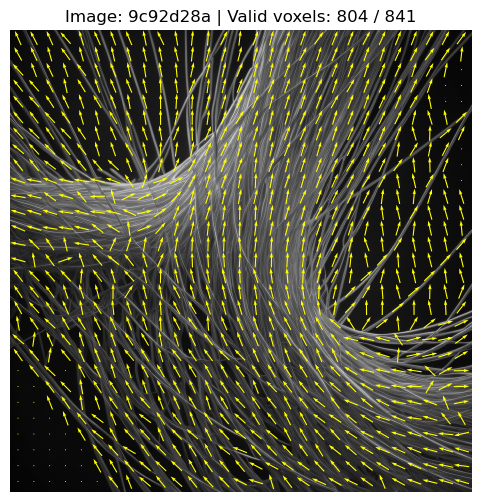

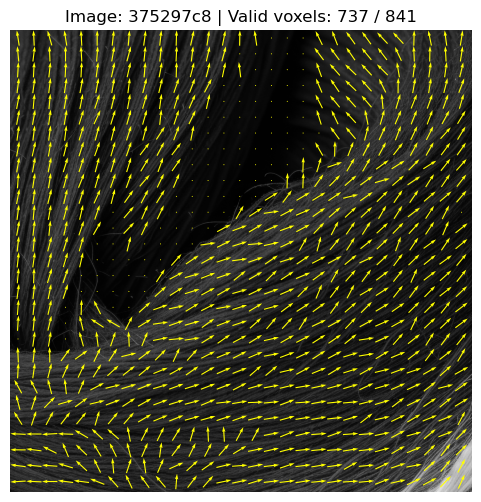

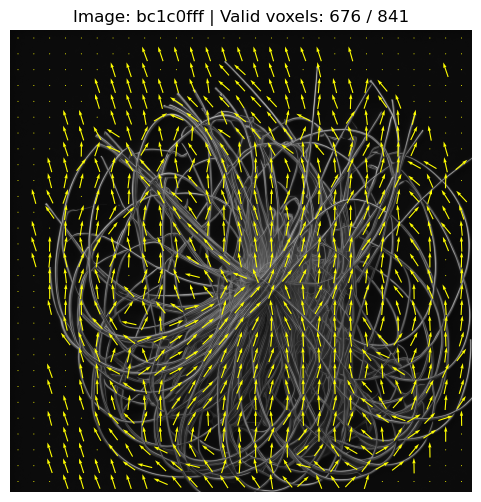

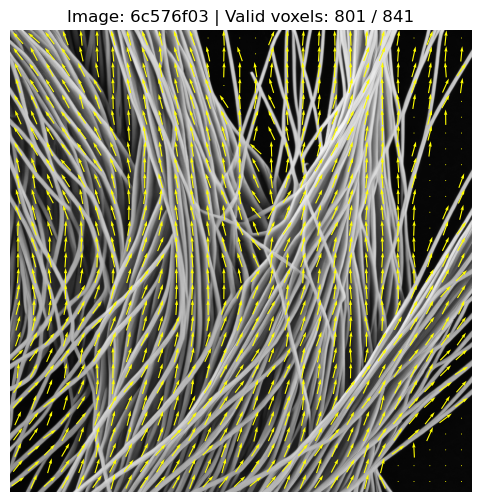

In [20]:
# Process test images from bio_test folder
TEST_FOLDER = '../images/diffusion_src/big'
VOXEL_SIZE = 96

# Get list of test images
test_images = [f for f in os.listdir(TEST_FOLDER) if f.endswith('.png')][::2]

print(f"Found {len(test_images)} test images")

# Process each test image
for img_name in test_images:
    img_path = os.path.join(TEST_FOLDER, img_name)
    
    # Load and convert image
    image = np.array(Image.open(img_path).convert('L'))
    
    # Slice image into voxels
    voxel_list, pos_list = slice_image(image, VOXEL_SIZE)
    
    # Get orientation map
    x, y, u, v, angle_list, counts = get_orientation_map(
        model,
        voxel_list, 
        pos_list, 
        VOXEL_SIZE
    )
    
    # Plot results
    plot_map(image, img_name[:8], x, y, u, v, counts, scale=30, color='yellow', figsize=(6, 6))